# **Descriptor calculation for refined ML models**



In [ ]:
# Set up working directory
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style='darkgrid')

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)
# to restrict the float value to 3 dcimal places
pd.set_option('display.float_format',lambda x:'%.3f'%x)
import warnings
warnings.filterwarnings('ignore')

In [ ]:
## After installing rdkit and mordred, it needs to restart the session to use the old version of numpy

## Package version matters
!pip install rdkit  ##version 2024.9.6
#!pip install xlsxwriter
!pip install mordred ##version 1.2.0

# import Chemoinformatic libraries
from rdkit import Chem
from rdkit.Chem import AllChem, Descriptors, Draw, PandasTools
from rdkit import DataStructs

In [ ]:
import numpy as np
print(np.__version__)

1.26.4


## **Calculate Molcular Descriptors**

### **Summary**


*   The RoMol in csv dataset can't be used to calculate descriptors.
*   Use the parent CID number (i.e., PUBCHEM_COMPOUND_CID) to retrieve 3D sdf from pubchem again.

*   Check if the orders of two dataset are still the same. Yes






In [ ]:
#load trainning dataset for classification
## As RoMol from csv can't be used for RDkit to calculate descriptors,
## 3D sdf of traning dataset was retrieved using the parent CID again.
##---------------------------------------------------------------------

frame = PandasTools.LoadSDF('/content/drive/MyDrive/AhR/07/3d_sdf_for_training_dataset.sdf')
df = pd.read_csv('/content/drive/MyDrive/AhR/06/Training_dataset_classification.csv')

[13:53:51] Warning: molecule is tagged as 3D, but all Z coords are zero and 2D stereo markers have been found, marking the mol as 2D.


In [ ]:
frame.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5741 entries, 0 to 5740
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   PUBCHEM_COMPOUND_CID            5741 non-null   object
 1   PUBCHEM_CONFORMER_RMSD          5741 non-null   object
 2   PUBCHEM_CONFORMER_DIVERSEORDER  5741 non-null   object
 3   PUBCHEM_MMFF94_PARTIAL_CHARGES  5731 non-null   object
 4   PUBCHEM_EFFECTIVE_ROTOR_COUNT   5741 non-null   object
 5   PUBCHEM_PHARMACOPHORE_FEATURES  5741 non-null   object
 6   PUBCHEM_HEAVY_ATOM_COUNT        5741 non-null   object
 7   PUBCHEM_ATOM_DEF_STEREO_COUNT   5741 non-null   object
 8   PUBCHEM_ATOM_UDEF_STEREO_COUNT  5741 non-null   object
 9   PUBCHEM_BOND_DEF_STEREO_COUNT   5741 non-null   object
 10  PUBCHEM_BOND_UDEF_STEREO_COUNT  5741 non-null   object
 11  PUBCHEM_ISOTOPIC_ATOM_COUNT     5741 non-null   object
 12  PUBCHEM_COMPONENT_COUNT         5741 non-null   objec

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5741 entries, 0 to 5740
Data columns (total 43 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   PUBCHEM_COMPOUND_CID            5741 non-null   float64
 1   PUBCHEM_CONFORMER_RMSD          5741 non-null   float64
 2   PUBCHEM_CONFORMER_DIVERSEORDER  5741 non-null   object 
 3   PUBCHEM_MMFF94_PARTIAL_CHARGES  5731 non-null   object 
 4   PUBCHEM_EFFECTIVE_ROTOR_COUNT   5741 non-null   float64
 5   PUBCHEM_PHARMACOPHORE_FEATURES  5741 non-null   object 
 6   PUBCHEM_HEAVY_ATOM_COUNT        5741 non-null   int64  
 7   PUBCHEM_ATOM_DEF_STEREO_COUNT   5741 non-null   int64  
 8   PUBCHEM_ATOM_UDEF_STEREO_COUNT  5741 non-null   int64  
 9   PUBCHEM_BOND_DEF_STEREO_COUNT   5741 non-null   int64  
 10  PUBCHEM_BOND_UDEF_STEREO_COUNT  5741 non-null   int64  
 11  PUBCHEM_ISOTOPIC_ATOM_COUNT     5741 non-null   int64  
 12  PUBCHEM_COMPONENT_COUNT         57

In [ ]:
## Check if the order of elements in two dataframe is the same.
## Need to provide labels using the dataframe read from csv.
##----------------------------------------------------------------------

frame['PUBCHEM_COMPOUND_CID'] = frame['PUBCHEM_COMPOUND_CID'].astype(float)
order = df['PUBCHEM_COMPOUND_CID'] == frame['PUBCHEM_COMPOUND_CID']
order.all()

True

In [ ]:
suppl = Chem.SDMolSupplier('/content/drive/MyDrive/AhR/07/3d_sdf_for_training_dataset.sdf')

[13:54:04] Warning: molecule is tagged as 3D, but all Z coords are zero and 2D stereo markers have been found, marking the mol as 2D.


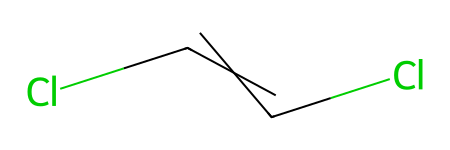

In [ ]:
suppl[236]

In [ ]:
CASRN = df['CASRN'].to_list()
from mordred import Calculator, descriptors
mordred_calc = Calculator(descriptors, ignore_3D=False)

# The deprecation for the aliases np.object, np.bool, np.float, np.complex, np.str, and np.int is expired (introduces NumPy 1.20)
np.float = float
np.int = int          #module 'numpy' has no attribute 'int'
np.object = object    #module 'numpy' has no attribute 'object'
np.bool = bool        #module 'numpy' has no attribute 'bool'


result = []
for mol in suppl:
  des = mordred_calc(mol)
  result.append(des)
Data_mordred = pd.DataFrame(result, index = CASRN)
Data_mordred.info()

[12:48:16] Warning: molecule is tagged as 3D, but all Z coords are zero and 2D stereo markers have been found, marking the mol as 2D.


<class 'pandas.core.frame.DataFrame'>
Index: 5741 entries, 118409-57-7 to 114651-37-5
Columns: 1826 entries, 0 to 1825
dtypes: bool(2), float64(811), int64(312), object(701)
memory usage: 79.9+ MB


In [ ]:
df.iloc[236]

,236
PUBCHEM_COMPOUND_CID,10900.000
PUBCHEM_CONFORMER_RMSD,0.400
PUBCHEM_CONFORMER_DIVERSEORDER,1
PUBCHEM_MMFF94_PARTIAL_CHARGES,6\n1 -0.14\n2 -0.14\n3 -0.01\n4 -0.01\n5 0.15\...
PUBCHEM_EFFECTIVE_ROTOR_COUNT,0.000
PUBCHEM_PHARMACOPHORE_FEATURES,0
PUBCHEM_HEAVY_ATOM_COUNT,4
PUBCHEM_ATOM_DEF_STEREO_COUNT,0
PUBCHEM_ATOM_UDEF_STEREO_COUNT,0
PUBCHEM_BOND_DEF_STEREO_COUNT,0


In [ ]:
frame.iloc[236]

,236
PUBCHEM_COMPOUND_CID,10900.000
PUBCHEM_CONFORMER_RMSD,0.4
PUBCHEM_CONFORMER_DIVERSEORDER,1
PUBCHEM_MMFF94_PARTIAL_CHARGES,6\n1 -0.14\n2 -0.14\n3 -0.01\n4 -0.01\n5 0.15\...
PUBCHEM_EFFECTIVE_ROTOR_COUNT,0
PUBCHEM_PHARMACOPHORE_FEATURES,0
PUBCHEM_HEAVY_ATOM_COUNT,4
PUBCHEM_ATOM_DEF_STEREO_COUNT,0
PUBCHEM_ATOM_UDEF_STEREO_COUNT,0
PUBCHEM_BOND_DEF_STEREO_COUNT,0


In [ ]:
Data_mordred.shape

(5741, 1826)

In [ ]:
Data_mordred.tail(5)

0      1     2     3      4     5     6      7     8     9     \
78995-09-2  19.856 15.636     0     1 34.283 2.415 4.830 34.283 1.319 4.172   
4023-65-8    8.394  8.665     3     0 12.654 2.194 4.388 12.654 1.055 3.322   
928-97-2     4.243  4.531     0     0  8.055 1.848 3.696  8.055 1.151 2.739   
764-99-8     7.071  6.766     0     0 13.192 1.932 3.864 13.192 1.199 3.202   
114651-37-5  8.485  7.696     0     0 15.369 2.224 4.449 15.369 1.281 3.361   

             10    11    12      13     14    15    16    17    18    19    \
78995-09-2  4.140 0.159 2.376 358.387 13.784 6.837    12    12    56    26   
4023-65-8   3.117 0.260 1.319  41.009  3.417 3.896     0     0    18    12   
928-97-2    2.514 0.359 0.565  16.800  2.400 2.465     0     0    19     7   
764-99-8    3.101 0.282 1.227  38.459  3.496 3.745     0     0    25    11   
114651-37-5 3.113 0.259 1.318  58.592  4.883 4.253     0     0    30    12   

             20    21    22    23    24    25    26    27    28    29    30    \
78995-09-2      0     0     3    30     0    23     2     1     0     0     0   
4023-65-8       0     0     6     6     0     6     0     6     0     0     0   
928-97-2        0     0     1    12     0     6     0     1     0     0     0   
764-99-8        0     0     3    14     0     8     0     3     0     0     0   
114651-37-5     0     0     2    18     0    10     0     2     0     0     0   

             31    32    33    34      35      36      37      38      39    \
78995-09-2      0     0     0     0 268.000 279.000 361.000 358.000 331.000   
4023-65-8       0     0     0     0 260.000 188.000 247.000 195.000 247.000   
928-97-2        0     0     0     0  56.000  37.000  31.000  28.000  21.000   
764-99-8        0     0     0     0 150.000 104.000  88.000 100.000  72.000   
114651-37-5     0     0     0     0 116.000  90.000  99.000  90.000  74.000   

               40      41      42      43      44      45      46      47    \
78995-09-2  318.000 261.000 183.000 158.000 160.000 206.000 339.000 409.000   
4023-65-8   330.000 121.000   0.000   0.000  56.000  60.000  79.000  81.000   
928-97-2     12.000   5.000   0.000   0.000  34.000  40.000  58.000  58.000   
764-99-8     60.000  56.000  44.000  33.000  52.000  60.000  84.000  84.000   
114651-37-5  57.000  39.000  42.000  19.000  70.000  91.000 149.000 173.000   

               48      49      50      51      52      53      54      55    \
78995-09-2  419.000 420.000 397.000 361.000 279.000 160.389 148.944 241.472   
4023-65-8    71.000  45.000  21.000   6.000   1.000 278.361 102.444 223.556   
928-97-2     43.000  33.000  24.000  12.000   3.000  66.750  49.250  71.000   
764-99-8     72.000  72.000  56.000  40.000  36.000  85.750  79.500 117.250   
114651-37-5 151.000 110.000  68.000  51.000  30.000  96.306  78.417 122.667   

               56      57      58      59      60      61       62       63    \
78995-09-2  317.944 355.000 390.556 412.389 327.083 250.306 1020.000 1236.000   
4023-65-8   175.889 190.778 433.500 227.333  28.000   1.000  606.000  510.000   
928-97-2     76.250  55.750  44.500  45.000  28.000   3.000  292.000  302.000   
764-99-8    115.000  84.750 102.500  78.250  56.000  62.000  494.000  516.000   
114651-37-5 150.944 169.500 129.917  85.750  86.833  42.167  506.000  578.000   

                64       65       66       67       68       69       70    \
78995-09-2  1767.000 2002.000 2026.000 2131.000 1967.000 1521.000 1125.000   
4023-65-8    715.000  654.000  707.000  791.000  335.000   34.000    1.000   
928-97-2     322.000  273.000  211.000  162.000  111.000   38.000    3.000   
764-99-8     566.000  512.000  440.000  404.000  320.000  256.000  208.000   
114651-37-5  767.000  812.000  675.000  476.000  348.000  251.000  139.000   

                71       72       73       74       75       76       77    \
78995-09-2  3996.917 4594.352 6361.571 6980.677 6926.597 7300.489 6407.867   
4023-65-8   2407.489 1959.007 2752.188 2368.47

In [ ]:
Data_mordred_name = pd.read_csv('/content/drive/MyDrive/AhR/07/mordred descriptors.csv', names = ['descriptors'])
descriptor_name = Data_mordred_name['descriptors'].to_list()

## rename columns using the list

Data_mordred.columns = descriptor_name

In [ ]:
Data_mordred['MW'].head(n = 20)

,MW
118409-57-7,186.043
22204-53-1,230.094
50505-91-4,223.157
24140-30-5,351.183
77-53-2,222.198
7313-87-3,271.194
42399-41-7,414.161
152885-09-1,208.077
467-55-0,430.308
33643-49-1,237.092


In [ ]:
Data_mordred.to_csv('Training_Classification_Data_mordred.csv', index = True)

## **Clean up descriptors**

### **Summary**

*   The task is to clean up object descriptors
*   Most missing values are present in object columns
*   After evaluation, I decided to remove all the columns that have missing values.


In [ ]:
##------------------------------------------------
##upload the calculated descriptors for saving time
df_label = pd.read_csv('/content/drive/MyDrive/AhR/06/Training_dataset_classification.csv')
df_mordred = pd.read_csv('/content/drive/MyDrive/AhR/10_finalize/Training_Classification_Data_mordred.csv', index_col=0)

# Remove entries 540-59-0 as this row is missing 3D coordinates
df_label_filter = df_label[df_label['CASRN'] != '540-59-0']
index = '540-59-0'
df_mordred_filter = df_mordred.drop(index=index)

In [ ]:
# Check the order of two dataframe
order1 = df_label_filter ['CASRN'] == df_mordred_filter.index
order1.all()

True

In [ ]:
object = df_mordred_filter.select_dtypes(include=['object'])
object.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5740 entries, 118409-57-7 to 114651-37-5
Columns: 701 entries, AATS3dv to Vabc
dtypes: object(701)
memory usage: 30.7+ MB


In [ ]:
def get_cols_without_text(df):
    """
    Checks each column in the DataFrame for presence of text entries.
    Returns a list of columns that contain only numeric data.
    """
    cols_with_no_text = []

    for col in df.columns:
        num_numbers = 0
        num_texts = 0
        for value in df[col]:
            if isinstance(value, str):
                try:
                    float(value)
                    num_numbers += 1
                except ValueError:
                    num_texts += 1
            elif isinstance(value, (int, float)):
                num_numbers += 1
            else:
                num_texts += 1
        # Append column if no text entries are found
        if num_texts == 0:
            cols_with_no_text.append(col)

    return cols_with_no_text

In [ ]:
# Function to convert object columns to float
def convert_object_to_float(df):
    for column in df.select_dtypes(include='object').columns:
        df[column] = df[column].astype(float)  # Convert to float, set errors to NaN
    return df

In [ ]:
cols_with_no_text = get_cols_without_text(object)
#len(cols_with_no_text)

# remove non numerical features.
df_mordred_filter_num = df_mordred_filter.select_dtypes(include=['float64', 'int64', 'object'])

object_col = object.columns.to_list()
Remove_object_col = [col for col in object_col if col not in cols_with_no_text]
df_mordred_filter_num = df_mordred_filter_num.drop(columns=Remove_object_col)

## Convert object columns to float columns
df_mordred_filter_num = convert_object_to_float(df_mordred_filter_num)

for col in df_mordred_filter_num.select_dtypes(include='int').columns:
    df_mordred_filter_num[col] = df_mordred_filter_num[col].astype(float)

In [ ]:
df_mordred_filter_num.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5740 entries, 118409-57-7 to 114651-37-5
Columns: 1179 entries, ABC to mZagreb2
dtypes: float64(1179)
memory usage: 51.7+ MB


In [ ]:
Label_tdc = pd.DataFrame(df_label_filter['Call_after_fit'])
Label_tdc = Label_tdc.rename(columns={'Call_after_fit': 'Label'})
Label_tdc['Label'] = Label_tdc['Label'].replace({'Active': 1, 'Inactive': 0})
df_mordred_filter_num['Label'] = Label_tdc['Label'].tolist()

In [ ]:
df_mordred_filter_num.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5740 entries, 118409-57-7 to 114651-37-5
Columns: 1180 entries, ABC to Label
dtypes: float64(1179), int64(1)
memory usage: 51.7+ MB


## **Curate desriptors for updated structures**

### **Summary**

*   As Tox21 dataset lacks PAHs, PCBs and dioxins, we decided to add these chemicals into the training dataset for either classification model and regression model
*   Dioxin like compounds, including PCBs are from a peer review article.
*   PAHs are from our confirmed bioassay.

In [ ]:
df_DLC = pd.read_csv('/content/drive/MyDrive/AhR/10_finalize/Structures_for_classification_model.csv')

df_DLC.rename(columns={'CIDs': 'CID'}, inplace=True)
df['CID'] = df['CID'].astype(int)
# check the overlap between training dataset for classification and doxin like compounds including confirmed bioassay structures
overlap = pd.merge(df, df_DLC, on='CID', how='inner')
remove_entries = overlap['CASRN_x'].to_list()

df_DLC_filter = df_DLC[~df_DLC['CASRN'].isin(remove_entries)]

In [ ]:
df_DLC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Chemicals       44 non-null     object
 1   Preferred name  44 non-null     object
 2   CASRN           44 non-null     object
 3   inchikey        44 non-null     object
 4   CID             44 non-null     int64 
 5   AhR_activity    44 non-null     object
 6   Chemical group  44 non-null     object
dtypes: int64(1), object(6)
memory usage: 2.5+ KB


In [ ]:
remove_entries

['35065-27-1', '1746-01-6', '56-55-3', '50-32-8', '192-97-2', '218-01-9']

In [ ]:
df[df['CASRN'].str.contains('85-01-8')]

,PUBCHEM_COMPOUND_CID,PUBCHEM_CONFORMER_RMSD,PUBCHEM_CONFORMER_DIVERSEORDER,PUBCHEM_MMFF94_PARTIAL_CHARGES,PUBCHEM_EFFECTIVE_ROTOR_COUNT,PUBCHEM_PHARMACOPHORE_FEATURES,PUBCHEM_HEAVY_ATOM_COUNT,PUBCHEM_ATOM_DEF_STEREO_COUNT,PUBCHEM_ATOM_UDEF_STEREO_COUNT,PUBCHEM_BOND_DEF_STEREO_COUNT,PUBCHEM_BOND_UDEF_STEREO_COUNT,PUBCHEM_ISOTOPIC_ATOM_COUNT,PUBCHEM_COMPONENT_COUNT,PUBCHEM_CACTVS_TAUTO_COUNT,PUBCHEM_CONFORMER_ID,PUBCHEM_MMFF94_ENERGY,PUBCHEM_FEATURE_SELFOVERLAP,PUBCHEM_SHAPE_FINGERPRINT,PUBCHEM_SHAPE_MULTIPOLES,PUBCHEM_SHAPE_SELFOVERLAP,PUBCHEM_SHAPE_VOLUME,PUBCHEM_COORDINATE_TYPE,ID,ROMol,MW,LogP,index,Compound,CASRN,Call,EC50_concentration,Endpoint,Is_viability,AC50_fit,Slope_fit,Top_fit,Bottom_fit,AC_10,Call_after_fit,Confidence,Plot_Nr,CID,Comment
4632,995.000,0.400,1,20\n10 -0.15\n11 -0.15\n12 -0.15\n13 -0.15\n14...,0.000,3\n6 1 2 3 4 5 6 rings\n6 1 3 7 9 11 13 rings\...,14,0,0,0,0,0,1,1,000003E300000001,47.504,15.272,10608611 8 18410851066377001248\n10618630 7 18...,288.11\n5.53\n2.14\n0.62\n0\n0.35\n0\n-1.54\n0...,652.127,138.900,2\n5\n10,995,<rdkit.Chem.rdchem.Mol object at 0x7c8747fc4dd0>,178.078,3.993,6284,Phenanthrene,85-01-8,Inactive,NaN,TOX21_AhR_LUC_Agonist,False,NaN,NaN,NaN,NaN,NaN,Inactive,NaN,#12829,995,3D sdf retrieved.


In [ ]:
overlap.head(n = 6)

,PUBCHEM_COMPOUND_CID,PUBCHEM_CONFORMER_RMSD,PUBCHEM_CONFORMER_DIVERSEORDER,PUBCHEM_MMFF94_PARTIAL_CHARGES,PUBCHEM_EFFECTIVE_ROTOR_COUNT,PUBCHEM_PHARMACOPHORE_FEATURES,PUBCHEM_HEAVY_ATOM_COUNT,PUBCHEM_ATOM_DEF_STEREO_COUNT,PUBCHEM_ATOM_UDEF_STEREO_COUNT,PUBCHEM_BOND_DEF_STEREO_COUNT,PUBCHEM_BOND_UDEF_STEREO_COUNT,PUBCHEM_ISOTOPIC_ATOM_COUNT,PUBCHEM_COMPONENT_COUNT,PUBCHEM_CACTVS_TAUTO_COUNT,PUBCHEM_CONFORMER_ID,PUBCHEM_MMFF94_ENERGY,PUBCHEM_FEATURE_SELFOVERLAP,PUBCHEM_SHAPE_FINGERPRINT,PUBCHEM_SHAPE_MULTIPOLES,PUBCHEM_SHAPE_SELFOVERLAP,PUBCHEM_SHAPE_VOLUME,PUBCHEM_COORDINATE_TYPE,ID,ROMol,MW,LogP,index,Compound,CASRN_x,Call,EC50_concentration,Endpoint,Is_viability,AC50_fit,Slope_fit,Top_fit,Bottom_fit,AC_10,Call_after_fit,Confidence,Plot_Nr,CID,Comment,Chemicals,Preferred name,CASRN_y,inchikey,AhR_activity,Chemical group
0,37034.000,0.600,1\n2,20\n1 -0.18\n10 0.18\n11 -0.15\n12 -0.15\n13 0...,1.000,2\n6 7 9 11 13 15 17 rings\n6 8 10 12 14 16 18...,18,0,0,0,0,0,1,1,000090AA00000001,48.523,10.149,10062212 137 18342174496965668663\n10366900 7 ...,381.65\n9.01\n1.85\n1.78\n0\n0.01\n0\n-3.35\n0...,773.574,215.200,2\n5\n10,37034,<rdkit.Chem.rdchem.Mol object at 0x7c8748df6570>,357.844,7.274,821,"2,2',4,4',5,5'-Hexachlorobiphenyl",35065-27-1,Inactive,NaN,TOX21_AhR_LUC_Agonist,False,NaN,NaN,NaN,NaN,NaN,Inactive,NaN,#1681,37034,3D sdf retrieved.,"2,2',4,4',5,5'-Hexachlorobiphenyl",PCB153,35065-27-1,MVWHGTYKUMDIHL-UHFFFAOYSA-N,Inactive,Di-ortho–substituted PCBs
1,15625.000,0.600,1,22\n1 -0.18\n10 0.08\n11 -0.15\n12 -0.15\n13 -...,0.400,5\n1 5 acceptor\n1 6 acceptor\n6 5 6 7 8 9 10 ...,18,0,0,0,0,0,1,1,00003D0900000001,49.038,25.449,10014705 185 18333447625989334109\n10062212 13...,366.17\n11.27\n2.08\n0.62\n0\n0\n0\n0\n0\n0\n0...,780.059,207.300,2\n5\n10,15625,<rdkit.Chem.rdchem.Mol object at 0x7c8748e46340>,319.897,6.198,908,"2,3,7,8-Tetrachlorodibenzo-1,4-dioxin",1746-01-6,QC-Omit,NaN,TOX21_AhR_LUC_Agonist,False,NaN,NaN,NaN,NaN,NaN,Active,0.218,#1857,15625,3D sdf retrieved.,"2,3,7,8-Tetrachlorodibenzo-1,4-dioxin","2,3,7,8-TCDD",1746-01-6,HGUFODBRKLSHSI-UHFFFAOYSA-N,Active,Chlorinated dibenzo-p-dioxins
2,5954.000,0.400,1,24\n10 -0.15\n11 -0.15\n12 -0.15\n13 -0.15\n14...,0.000,4\n6 1 2 3 6 9 10 rings\n6 1 2 4 5 7 8 rings\n...,18,0,0,0,0,0,1,1,0000174200000001,62.991,20.370,10411042 1 17257653318591806427\n10608611 8 18...,370.43\n8.99\n2.26\n0.62\n2.18\n0.32\n0\n-3.13...,852.554,173.100,2\n5\n10,5954,<rdkit.Chem.rdchem.Mol object at 0x7c8748998dd0>,228.094,5.146,2716,Benz(a)anthracene,56-55-3,QC-Omit,NaN,TOX21_AhR_LUC_Agonist,False,0.881,1.130,189.504,0.000,-0.228,Active,0.737,#5519,5954,3D sdf retrieved.,Benz(a)anthracene,Benz(a)anthracene,56-55-3,DXBHBZVCASKNBY-UHFFFAOYSA-N,Active,PAHs
3,2336.000,0.600,1,24\n10 -0.15\n11 -0.15\n12 -0.15\n13 -0.15\n14...,0.000,5\n6 1 2 3 6 10 12 rings\n6 1 2 4 7 11 13 ring...,20,0,0,0,0,0,1,1,0000092000000001,74.317,25.526,10411042 1 17474107597041034351\n10608611 8 18...,411.59\n8.12\n2.7\n0.62\n3.29\n0.28\n0\n-1.12\...,971.115,186.000,2\n5\n10,2336,<rdkit.Chem.rdchem.Mol object at 0x7c8748999d20>,252.094,5.737,2742,Benzo[a]pyrene,50-32-8,QC-Omit,NaN,TOX21_AhR_LUC_Agonist,False,0.477,0.904,74.989,0.000,-0.423,Active,0.710,#5577,2336,3D sdf retrieved.,Benzo[a]pyrene,Benzo[a]pyrene,50-32-8,FMMWHPNWAFZXNH-UHFFFAOYSA-N,Active,PAHs
4,9128.000,0.600,1,24\n10 -0.15\n11 -0.15\n12 -0.15\n13 -0.15\n14...,0.000,5\n6 1 2 3 4 5 6 rings\n6 1 2 7 8 11 12 rings\...,20,0,0,0,0,0,1,1,000023A800000001,79.487,25.521,10319926 262 16896773798536264378\n10411042 1 ...,411.59\n5.53\n4.23\n0.62\n4.14\n0\n0\n0\n0\n-2...,969.696,186.400,2\n5\n10,9128,<rdkit.Chem.rdchem.Mol object at 0x7c8748999e00>,252.094,5.737,2743,Benzo[e]pyrene,192-97-2,Active,1.337,TOX21_AhR_LUC_Agonist,False,NaN,NaN,NaN,NaN,NaN,Active,0.295,#5579,9128,3D sdf retrieved.,Benzo[e]pyrene,Benzo[e]pyrene,192-97-2,TXVHTIQJNYSSKO-UHFFFAOYSA-N,Inactive,PAHs
5,9171.000,0.400,1,24\n10 -0.15\n11 -0.15\n12 -0.15\n13 -0.15\n14...,0.000,4\n6 1 2 3 5 8 10 rings\n6 1 2 4 

In [ ]:
df_DLC_filter.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38 entries, 1 to 43
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Chemicals       38 non-null     object
 1   Preferred name  38 non-null     object
 2   CASRN           38 non-null     object
 3   inchikey        38 non-null     object
 4   CID             38 non-null     int64 
 5   AhR_activity    38 non-null     object
 6   Chemical group  38 non-null     object
dtypes: int64(1), object(6)
memory usage: 2.4+ KB


In [ ]:
# Output the CID for PubChem batch searching for 3D sdf
df_DLC_CID = pd.DataFrame(df_DLC_filter['CID'].tolist(), columns=['CID'])
df_DLC_CID.to_csv('df_DLC_CID.csv', index = False, header = False)

In [ ]:
frame_DLC = PandasTools.LoadSDF('/content/drive/MyDrive/AhR/10_finalize/3D_SDF_df_DLC.sdf')

In [ ]:
frame_DLC.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38 entries, 0 to 37
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   PUBCHEM_COMPOUND_CID            38 non-null     object
 1   PUBCHEM_CONFORMER_RMSD          38 non-null     object
 2   PUBCHEM_CONFORMER_DIVERSEORDER  38 non-null     object
 3   PUBCHEM_MMFF94_PARTIAL_CHARGES  38 non-null     object
 4   PUBCHEM_EFFECTIVE_ROTOR_COUNT   38 non-null     object
 5   PUBCHEM_PHARMACOPHORE_FEATURES  38 non-null     object
 6   PUBCHEM_HEAVY_ATOM_COUNT        38 non-null     object
 7   PUBCHEM_ATOM_DEF_STEREO_COUNT   38 non-null     object
 8   PUBCHEM_ATOM_UDEF_STEREO_COUNT  38 non-null     object
 9   PUBCHEM_BOND_DEF_STEREO_COUNT   38 non-null     object
 10  PUBCHEM_BOND_UDEF_STEREO_COUNT  38 non-null     object
 11  PUBCHEM_ISOTOPIC_ATOM_COUNT     38 non-null     object
 12  PUBCHEM_COMPONENT_COUNT         38 non-null     object
 1

In [ ]:
## Check if the order of elements in two dataframe is the same.
## Need to provide labels using the dataframe read from csv.
##----------------------------------------------------------------------

frame_DLC['PUBCHEM_COMPOUND_CID'] = frame_DLC['PUBCHEM_COMPOUND_CID'].astype(int)
df_DLC_filter['CID'] = df_DLC_filter['CID'].astype(int)
df_DLC_filter = df_DLC_filter.reset_index(drop=True)

order_DLC = df_DLC_filter['CID'] == frame_DLC['PUBCHEM_COMPOUND_CID']
order_DLC.all()

True

In [ ]:
suppl_DLC = Chem.SDMolSupplier('/content/drive/MyDrive/AhR/10_finalize/3D_SDF_df_DLC.sdf')

In [ ]:
CASRN_DLC = df_DLC_filter['CASRN'].to_list()

from mordred import Calculator, descriptors
mordred_calc = Calculator(descriptors, ignore_3D=False)

# The deprecation for the aliases np.object, np.bool, np.float, np.complex, np.str, and np.int is expired (introduces NumPy 1.20)
np.float = float
np.int = int          #module 'numpy' has no attribute 'int'
np.object = object    #module 'numpy' has no attribute 'object'
np.bool = bool        #module 'numpy' has no attribute 'bool'


result = []
for mol in suppl_DLC:
  des = mordred_calc(mol)
  result.append(des)
df_mordred_DLC = pd.DataFrame(result, index = CASRN_DLC)
df_mordred_DLC.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38 entries, 40321-76-4 to 198-55-0
Columns: 1826 entries, 0 to 1825
dtypes: bool(2), float64(1132), int64(345), object(347)
memory usage: 541.9+ KB


In [ ]:
Data_mordred_name = pd.read_csv('/content/drive/MyDrive/AhR/07/mordred descriptors.csv', names = ['descriptors'])
descriptor_name = Data_mordred_name['descriptors'].to_list()

## rename columns using the list

df_mordred_DLC.columns = descriptor_name

In [ ]:
Label_DLC = pd.DataFrame(df_DLC_filter['AhR_activity'])
Label_DLC = Label_DLC.rename(columns={'AhR_activity': 'Label'})
Label_DLC['Label'] = Label_DLC['Label'].replace({'Active': 1, 'Inactive': 0})

df_mordred_DLC['Label'] = Label_DLC['Label'].tolist()

In [ ]:
df_mordred_DLC.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38 entries, 40321-76-4 to 198-55-0
Columns: 1827 entries, ABC to Label
dtypes: bool(2), float64(1132), int64(346), object(347)
memory usage: 542.2+ KB


In [ ]:
# Select columns in df_DLC
numeric_columns = df_mordred_filter_num.columns
df_mordred_DLC = df_mordred_DLC[numeric_columns]

for col in df_mordred_DLC.select_dtypes(include='int').columns:
    df_mordred_DLC[col] = df_mordred_DLC[col].astype(float)

df_mordred_DLC['Label'] = df_mordred_DLC['Label'].astype(int)

In [ ]:
df_mordred_DLC.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38 entries, 40321-76-4 to 198-55-0
Columns: 1180 entries, ABC to Label
dtypes: float64(1179), int64(1)
memory usage: 350.6+ KB


In [ ]:
stacked_df_mordred = pd.concat([df_mordred_filter_num, df_mordred_DLC])

In [ ]:
stacked_df_mordred.tail()

,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,VE1_A,VE2_A,VE3_A,VR1_A,VR2_A,VR3_A,nAromAtom,nAromBond,nAtom,nHeavyAtom,nSpiro,nBridgehead,nHetero,nH,nB,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS1dv,ATS2dv,ATS3dv,ATS4dv,ATS5dv,ATS6dv,ATS7dv,ATS8dv,ATS0d,ATS1d,ATS2d,ATS3d,ATS4d,ATS5d,ATS6d,ATS7d,ATS8d,ATS0s,ATS1s,ATS2s,ATS3s,ATS4s,ATS5s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS6Z,ATS7Z,ATS8Z,ATS0m,ATS1m,ATS2m,ATS3m,ATS4m,ATS5m,ATS6m,ATS7m,ATS8m,ATS0v,ATS1v,ATS2v,ATS3v,ATS4v,ATS5v,ATS6v,ATS7v,ATS8v,ATS0se,ATS1se,ATS2se,ATS3se,ATS4se,ATS5se,ATS6se,ATS7se,ATS8se,ATS0pe,ATS1pe,ATS2pe,ATS3pe,ATS4pe,ATS5pe,ATS6pe,ATS7pe,ATS8pe,ATS0are,ATS1are,ATS2are,ATS3are,ATS4are,ATS5are,ATS6are,ATS7are,ATS8are,ATS0p,ATS1p,ATS2p,ATS3p,ATS4p,ATS5p,ATS6p,ATS7p,ATS8p,ATS0i,ATS1i,ATS2i,ATS3i,ATS4i,ATS5i,ATS6i,ATS7i,ATS8i,AATS0dv,AATS1dv,AATS2dv,AATS0d,AATS1d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0m,AATS1m,AATS2m,AATS0v,AATS1v,AATS2v,AATS0se,AATS1se,AATS2se,AATS0pe,AATS1pe,AATS2pe,AATS0are,AATS1are,AATS2are,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC0d,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC0s,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC0Z,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC0m,ATSC1m,ATSC2m,ATSC3m,ATSC4m,ATSC5m,ATSC6m,ATSC7m,ATSC8m,ATSC0v,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC0pe,ATSC1pe,ATSC2pe,ATSC3pe,ATSC4pe,ATSC5pe,ATSC6pe,ATSC7pe,ATSC8pe,ATSC0are,ATSC1are,ATSC2are,ATSC3are,ATSC4are,ATSC5are,ATSC6are,ATSC7are,ATSC8are,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0m,AATSC1m,AATSC2m,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0pe,AATSC1pe,AATSC2pe,AATSC0are,AATSC1are,AATSC2are,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1m,MATS2m,MATS1v,MATS2v,MATS1se,MATS2se,MATS1pe,MATS2pe,MATS1are,MATS2are,MATS1p,MATS2p,MATS1i,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1m,GATS2m,GATS1v,GATS2v,GATS1se,GATS2se,GATS1pe,GATS2pe,GATS1are,GATS2are,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTm-1h,BCUTm-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTpe-1h,BCUTpe-1l,BCUTare-1h,BCUTare-1l,BCUTp-1h,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpAbs_DzZ,SpMax_DzZ,SpDiam_DzZ,SpAD_DzZ,SpMAD_DzZ,LogEE_DzZ,SM1_DzZ,VE1_DzZ,VE2_DzZ,VE3_DzZ,VR1_DzZ,VR2_DzZ,VR3_DzZ,SpAbs_Dzm,SpMax_Dzm,SpDiam_Dzm,SpAD_Dzm,SpMAD_Dzm,LogEE_Dzm,SM1_Dzm,VE1_Dzm,VE2_Dzm,VE3_Dzm,VR1_Dzm,VR2_Dzm,VR3_Dzm,SpAbs_Dzv,SpMax_Dzv,SpDiam_Dzv,SpAD_Dzv,SpMAD_Dzv,LogEE_Dzv,SM1_Dzv,VE1_Dzv,VE2_Dzv,VE3_Dzv,VR1_Dzv,VR2_Dzv,VR3_Dzv,SpAbs_Dzse,SpMax_Dzse,SpDiam_Dzse,SpAD_Dzse,SpMAD_Dzse,LogEE_Dzse,SM1_Dzse,VE1_Dzse,VE2_Dzse,VE3_Dzse,VR1_Dzse,VR2_Dzse,VR3_Dzse,SpAbs_Dzpe,SpMax_Dzpe,SpDiam_Dzpe,SpAD_Dzpe,SpMAD_Dzpe,LogEE_Dzpe,SM1_Dzpe,VE1_Dzpe,VE2_Dzpe,VE3_Dzpe,VR1_Dzpe,VR2_Dzpe,VR3_Dzpe,SpAbs_Dzare,SpMax_Dzare,SpDiam_Dzare,SpAD_Dzare,SpMAD_Dzare,LogEE_Dzare,SM1_Dzare,VE1_Dzare,VE2_Dzare,VE3_Dzare,VR1_Dzare,VR2_Dzare,VR3_Dzare,SpAbs_Dzp,SpMax_Dzp,SpDiam_Dzp,SpAD_Dzp,SpMAD_Dzp,LogEE_Dzp,SM1_Dzp,VE1_Dzp,VE2_Dzp,VE3_Dzp,VR1_Dzp,VR2_Dzp,VR3_Dzp,SpAbs_Dzi,SpMax_Dzi,SpDiam_Dzi,SpAD_Dzi,SpMAD_Dzi,LogEE_Dzi,SM1_Dzi,VE1_Dzi,VE2_Dzi,VE3_Dzi,VR1_Dzi,VR2_Dzi,VR3_Dzi,BertzCT,nBonds,nBondsO,nBondsS,nBondsD,nBondsT,nBondsA,nBondsM,nBondsKS,nBondsKD,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,PPSA5,DPSA1,DPSA2,DPSA3,DPSA4,DPSA5,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA1,FPSA2,FPSA3,FPSA4,FPSA5,

In [ ]:
stacked_df_mordred.to_csv('Training_Classification_Data_mordred_withDLC.csv', index = True)

## **Molecular descriptor selection**

### **Summary**

*   Filter out the zero variance and highly correlated features
*   Stack two dataframe and define the application domain


In [ ]:
from sklearn.feature_selection import VarianceThreshold

def feature_selection(df, nonzero_thrd=0.0, cor_thrd=0.95):
    '''
    Remove zero variance features and highly correlated features.

    Parameters:
    - df: DataFrame of training features
    - nonzero_thrd: threshold for variance; features with variance <= this are removed
    - cor_thrd: correlation threshold; features with correlation > this are removed

    Returns:
    - DataFrame with selected features
    '''

    # Remove zero variance features
    selector = VarianceThreshold(threshold=nonzero_thrd)
    selector.fit(df)
    nonzero_cols = df.columns[selector.get_support(indices=True)]
    nonzero_df = df[nonzero_cols]

    # Create correlation matrix of remaining features
    corr_matrix = nonzero_df.corr().abs()

    # Select upper triangle of the correlation matrix to avoid duplicates
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Find columns to drop with correlation above threshold
    to_drop = set()
    for column in upper.columns:
        # If any correlated feature in column exceeds the threshold, mark it for dropping
        if any(upper[column] > cor_thrd):
            to_drop.add(column)

    # Drop highly correlated features
    selected_df = nonzero_df.drop(columns=to_drop)

    return selected_df

In [ ]:
stacked_df_for_DS = stacked_df_mordred.drop(columns = ['Label'])
## Sometimes, it has some errors. Don't know why. Just restart the session and run all the script again to reproduce the results.
af = feature_selection(stacked_df_for_DS)

In [ ]:
af.shape

(5778, 529)

In [ ]:
af.tail(5)

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
af.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5778 entries, 118409-57-7 to 198-55-0
Columns: 529 entries, ABC to mZagreb1
dtypes: float64(529)
memory usage: 23.4+ MB


In [ ]:
af['Label'] = stacked_df_mordred['Label']

In [ ]:
af.to_csv('Training_data_classification_selected_descriptors.csv', index = True)

***For the new dataset, 529 numerical descriptors left for 5778 entry***

### **Exploratory Data Analysis (EDA) and Visualization**



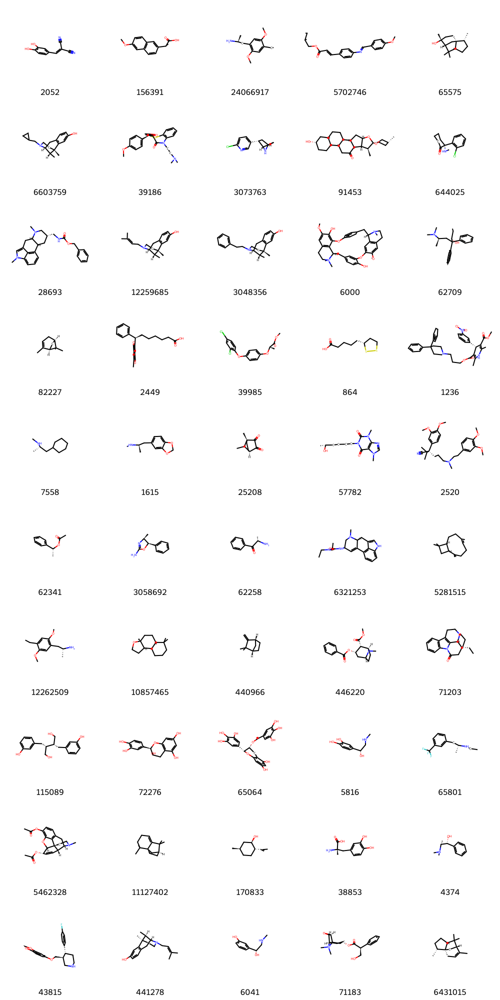

In [ ]:
# Draw the molecular structures in the dataframe
PandasTools.FrameToGridImage(frame, legendsCol="PUBCHEM_COMPOUND_CID", molsPerRow=5)

In [ ]:
# Function to plot a boxplot and a histogram along the same scale

def histogram_boxplot(data, feature, figsize = (12, 7), kde = False, bins = None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows = 2,      # Number of rows of the subplot grid = 2
        sharex = True,    # x-axis will be shared among all subplots
        gridspec_kw = {"height_ratios": (0.25, 0.75)},
        figsize = figsize,
    )                   # Creating the 2 subplots
    sns.boxplot(
        data = data, x = feature, ax = ax_box2, showmeans = True, color = "yellow"
    )                   # Boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2, bins = bins, palette = "winter"
    ) if bins else sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2
    )                   # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color = "green", linestyle = "--"
    )                   # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color = "black", linestyle = "-"
    )                   # Add median to the histogram
    #plt.savefig(feature, format='png')

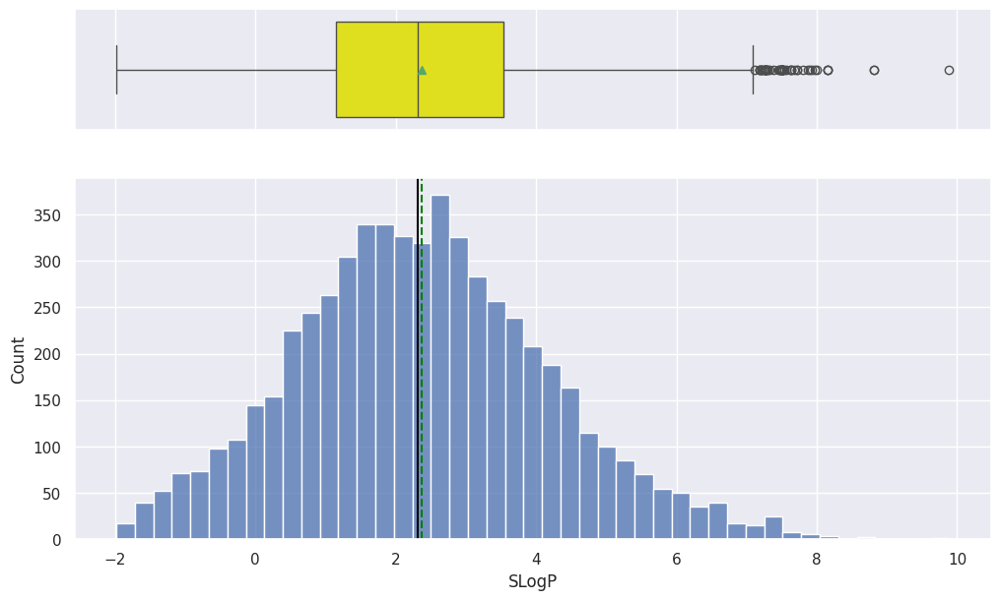

In [ ]:
# univariate analysis of Confidence
histogram_boxplot(af, "SLogP")

<Axes: xlabel='Label', ylabel='ABC'>

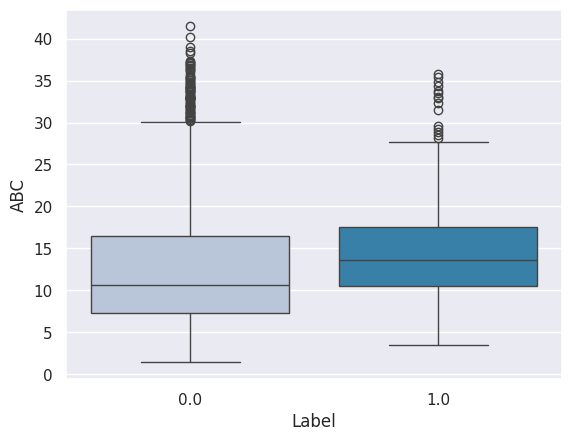

In [ ]:
sns.boxplot(x=Data_mordred_filtered["Label"],y= DF['ABC'],palette="PuBu")

In [ ]:
columns = DF.columns
#column1 = columns[:300]
plt.figure(figsize = (50, 500)) # wide, length
for i, variable in enumerate(columns):
    plt.subplot(100, 6, i + 1)
    sns.boxplot(x=Data_mordred_filtered["Label"],y= DF[variable],palette="PuBu")
    plt.tight_layout()
    plt.title(variable)
    #plt.xticks(index, df.index, rotation = 90)
    #plt.ylabel('Concentration (ng/mL)')
    #plt.savefig('Spatial Distribution.jpg')
plt.show()

In [ ]:
Data_mordred_filtered['GeomRadius'].min()

1.0366

## **Normalize the numerical feautres**

In [ ]:
af = pd.read_csv('/content/Training_data_classification_selected_descriptors.csv', index_col = 0)

In [ ]:
af_without_labels = af.drop(columns = ['Label'])

In [ ]:
# To scale the data from 0-1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

##-----------------------------------------------
## The fit() method is called on training dataset, which computes and stores the minimum and maximum values of each feature in each column
scaler = scaler.fit(af_without_labels)

## The transform() method uses the min and max values computed from training dataset to scale the training dataset and in_house dataset as well as future test dataset.
Training_data_classification_selected_descriptors_scaled = scaler.transform(af_without_labels)

In [ ]:
Training_data_classification_selected_descriptors_scaled.shape

(5778, 529)

In [ ]:
Training_data_classification_selected_descriptors_scaled = pd.DataFrame(Training_data_classification_selected_descriptors_scaled, columns = af_without_labels.columns, index = af_without_labels.index)
Training_data_classification_selected_descriptors_scaled['Label'] = af['Label']

In [ ]:
Training_data_classification_selected_descriptors_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5778 entries, 118409-57-7 to 198-55-0
Columns: 530 entries, ABC to Label
dtypes: float64(529), int64(1)
memory usage: 23.4+ MB


In [ ]:
Training_data_classification_selected_descriptors_scaled.head(5)

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
Training_data_classification_selected_descriptors_scaled.to_csv('Training_data_classification_selected_descriptors_scaled.csv', index = True)

## **Curate descriptors for in house dataset**

In [ ]:
#load in-house dataset with calculated 3D descriptors (ihm)
ihm = pd.read_csv('/content/drive/MyDrive/AhR/10_finalize/in_house_mordred_high_specificity.csv', index_col=0)

numeric_columns = af_without_labels.columns
ihm_filter = ihm[numeric_columns]

In [ ]:
## Using MinMaxScaler with values below the minimum from the fitting dataset will scale them accordingly, producing values less than 0.
## Handle these out-of-bound values by clipping

ihm_scaled = scaler.transform(ihm_filter)
ihm_scaled = pd.DataFrame(ihm_scaled, columns = ihm_filter.columns, index = ihm.index)

In [ ]:
ihm_scaled['Label'] = ihm['Label']

In [ ]:
ihm_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 60 entries, 120068-37-3 to 120983-64-4
Columns: 530 entries, ABC to Label
dtypes: float64(529), int64(1)
memory usage: 251.0+ KB


In [ ]:
ihm_scaled.to_csv('ihm_scaled_high_specificity.csv', index = True)

## **Application domain**

**Filter features**

Combine in house dataset and training dataset to determin the application domain, i.e., the min and max values of each feature in the dataset

In [ ]:
def check_above_max(scaler, df_to_check):
    """
    Check for values in df_to_check that are above the maximum values from a fitted scaler.

    Parameters:
        scaler: Fitted scaler object with attribute data_max_
        df_to_check: pandas DataFrame to check against scaler's max values

    Returns:
        A dictionary with columns as keys and info about above max values
    """
    max_values = scaler.data_max_
    above_max_info = {}

    for column in df_to_check.columns:
        # Check if column exists in scaler's data_max_ (to avoid KeyError)
        if column not in scaler.feature_names_in_:
            continue  # or handle as needed
        # Check which values are above the max for each column
        col_index = list(df_to_check.columns).index(column)
        above_max_values = df_to_check[column] > max_values[col_index]
        if above_max_values.any():
            # Get row indices and values where above max
            above_max_indices = df_to_check.index[above_max_values].tolist()
            above_max_info[column] = {
                'row_indices': above_max_indices,
                'values': df_to_check[column][above_max_values].tolist()
            }

    return above_max_info

In [ ]:
above_max = check_above_max(scaler, ihm_filter)

In [ ]:
above_max

{'nBr': {'row_indices': ['446255-26-1'], 'values': [7]},
 'ATSC5Z': {'row_indices': ['68631-49-2'], 'values': [1087.758034026465]},
 'ZMIC1': {'row_indices': ['68631-49-2', '446255-26-1'],
  'values': [141.946335554258, 163.20633389499113]},
 'ZMIC2': {'row_indices': ['68631-49-2', '446255-26-1'],
  'values': [134.77063896658672, 152.1624304647275]},
 'PEOE_VSA7': {'row_indices': ['446255-26-1'], 'values': [129.70870849103028]}}

In [ ]:
def check_below_min(scaler, df_to_check):
    """
    Check for values in df_to_check that are below the minimum values from a fitted scaler.

    Parameters:
        scaler: Fitted scaler object with attribute data_min_
        df_to_check: pandas DataFrame to check against scaler's min values

    Returns:
        A dictionary with columns as keys and info about below min values
    """
    min_values = scaler.data_min_
    below_min_info = {}

    for column in df_to_check.columns:
        # Check if column exists in scaler's features
        if column not in scaler.feature_names_in_:
            continue  # or handle as needed
        # Get index of the column in scaler's feature list
        col_index = list(df_to_check.columns).index(column)
        # Check which values are below the min
        below_min_values = df_to_check[column] < min_values[col_index]
        if below_min_values.any():
            # Get row indices and values
            below_min_indices = df_to_check.index[below_min_values].tolist()
            below_min_info[column] = {
                'row_indices': below_min_indices,
                'values': df_to_check[column][below_min_values].tolist()
            }
    return below_min_info

In [ ]:
below_min = check_below_min(scaler, ihm_filter)

In [ ]:
below_min

{}

In [ ]:
af_without_labels.iloc[:, 0].max()

41.448249042405095

In [ ]:
af_without_labels[af_without_labels.iloc[:, 0]==af_without_labels.iloc[:, 0].max()]

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
af_without_labels.iloc[:, 0].min()

1.4142135623730951

In [ ]:
af_without_labels[af_without_labels.iloc[:, 0]==af_without_labels.iloc[:, 0].min()]

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
numeric_columns = af_without_labels.columns
ad = pd.DataFrame(columns = ['Feature', 'min', 'max'])
for i, variable in enumerate(numeric_columns):
   ad.loc[i+1, 'Feature'] = variable
   ad.loc[i+1, 'min'] = af_without_labels[variable].min()
   ad.loc[i+1, 'max'] = af_without_labels[variable].max()

In [ ]:
ad.set_index('Feature', inplace = True)

In [ ]:
ad.info()

<class 'pandas.core.frame.DataFrame'>
Index: 529 entries, ABC to mZagreb1
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   min     529 non-null    object
 1   max     529 non-null    object
dtypes: object(2)
memory usage: 12.4+ KB


In [ ]:
ad.to_csv('Application_domain_ML.csv', index = True)

In [ ]:
##To check if the values of a row from one dataset are within the range defined by the minimum and maximum values of each column in another dataset

# Function to check if values exceed min and max
def check_ranges(row, df_ranges):
    min_values = df_ranges['min']
    max_values = df_ranges['max']

    flags = []
    for column in row.index:
        if row[column] < min_values[column]:
            flags.append('below_min')
        elif row[column] > max_values[column]:
            flags.append('above_max')
        else:
            flags.append('within_range')

    return pd.Series(flags, index=row.index)

# Apply the function to each row of in-house dataset and create flags
flags_df = ihm_filter.apply(lambda row: check_ranges(row, ad), axis=1)

In [ ]:
# Concatenate original df2 with the flags
#result_df = pd.concat([ihm_filter, flags_df.add_prefix('flag_')], axis=1)

In [ ]:
flags_df.head()

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
# Check which rows have 'below_min' or 'above_max'
rows_with_flags = flags_df[
    flags_df.filter(like='flag_').isin(['below_min', 'above_max']).any(axis=1)
]


rows_with_flags

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

## **Curation for PAHs validation**

In [ ]:
#df_val = pd.read_csv('/content/Confirmed_PAHs_for_validation.csv')
#frame_val = PandasTools.LoadSDF('/content/3d_SDF_PAHs_validation.sdf')

df_val = pd.read_csv('/content/Confirmed_PAHs_for_validation_withPCBs.csv')
frame_val = PandasTools.LoadSDF('/content/3d_SDF_PAHs_validation_withPCBs.sdf')


af = pd.read_csv('/content/Training_data_classification_selected_descriptors.csv', index_col = 0)
af_without_labels = af.drop(columns = ['Label'])

In [ ]:
## Check if the order of elements in two dataframe is the same.
## Need to provide labels using the dataframe read from csv.
##----------------------------------------------------------------------

frame_val['PUBCHEM_COMPOUND_CID'] = frame_val['PUBCHEM_COMPOUND_CID'].astype(int)
df_val['CID'] = df_val['CID'].astype(int)

order_val = df_val['CID'] == frame_val['PUBCHEM_COMPOUND_CID']
order_val.all()

True

In [ ]:
suppl_DLC = Chem.SDMolSupplier('/content/3d_SDF_PAHs_validation_withPCBs.sdf')

In [ ]:
CASRN_val = df_val['CASRN'].to_list()

from mordred import Calculator, descriptors
mordred_calc = Calculator(descriptors, ignore_3D=False)

# The deprecation for the aliases np.object, np.bool, np.float, np.complex, np.str, and np.int is expired (introduces NumPy 1.20)
np.float = float
np.int = int          #module 'numpy' has no attribute 'int'
np.object = object    #module 'numpy' has no attribute 'object'
np.bool = bool        #module 'numpy' has no attribute 'bool'


result = []
for mol in suppl_DLC:
  des = mordred_calc(mol)
  result.append(des)
df_mordred_val = pd.DataFrame(result, index = CASRN_val)
df_mordred_val.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14 entries, 191-26-4 to 57465-28-8
Columns: 1826 entries, 0 to 1825
dtypes: bool(2), float64(1140), int64(341), object(343)
memory usage: 199.6+ KB


In [ ]:
df_val.head(n=20)

,Chemicals,CASRN,inchikey,CID,EC10 (M),EC10(log µM)
0,Anthanthrene,191-26-4,YFIJJNAKSZUOLT-UHFFFAOYSA-N,9118,0.000,-1.227
1,"Chrysene, 1-methyl-",3351-28-8,LQKGSLMFGWWLIU-UHFFFAOYSA-N,18779,0.000,-1.761
2,7H-benzo(c)carbazole,205-25-4,UGFOTZLGPPWNPY-UHFFFAOYSA-N,67459,0.000,-0.694
3,"9,10-Anthracenedione",84-65-1,RZVHIXYEVGDQDX-UHFFFAOYSA-N,6780,0.000,0.729
4,2-Methylphenanthrene,2531-84-2,KANLOADZXMMCQA-UHFFFAOYSA-N,17321,0.000,0.995
5,"9,10-Anthracenedione, 2-methyl-",84-54-8,NJWGQARXZDRHCD-UHFFFAOYSA-N,6773,0.000,0.792
6,Retene,483-65-8,NXLOLUFNDSBYTP-UHFFFAOYSA-N,10222,0.000,-1.012
7,11H-Benzo[b]fluorene,243-17-4,HAPOJKSPCGLOOD-UHFFFAOYSA-N,9201,0.000,-1.396
8,"Benzo[b]naphtho[1,2-d]thiophene",205-43-6,XZUMOEVHCZXMTR-UHFFFAOYSA-N,9151,0.000,0.701
9,"Benzo[b]naphtho[2,1-d]thiophene",239-35-0,YEUHHUCOSQOCIX-UHFFFAOYSA-N,9198,0.000,0.136


In [ ]:
Data_mordred_name = pd.read_csv('/content/drive/MyDrive/AhR/07/mordred descriptors.csv', names = ['descriptors'])
descriptor_name = Data_mordred_name['descriptors'].to_list()

## rename columns using the list

df_mordred_val.columns = descriptor_name

In [ ]:
numeric_columns = af_without_labels.columns
df_mordred_val_filter = df_mordred_val[numeric_columns]

In [ ]:
df_mordred_val_filter.head()

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
## Using MinMaxScaler with values below the minimum from the fitting dataset will scale them accordingly, producing values less than 0.
## Handle these out-of-bound values by clipping
# To scale the data from 0-1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

##-----------------------------------------------
## The fit() method is called on training dataset, which computes and stores the minimum and maximum values of each feature in each column
scaler = scaler.fit(af_without_labels)

df_val_scaled = scaler.transform(df_mordred_val_filter)
df_val_scaled = pd.DataFrame(df_val_scaled, columns = df_mordred_val_filter.columns, index = df_mordred_val_filter.index)

In [ ]:
df_val_scaled.head(20)

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
df_val_scaled['AC_10'] = df_val['EC10(log µM)'].tolist()

In [ ]:
#df_val_scaled.to_csv('df_val_scaled.csv', index = True)
df_val_scaled.to_csv('df_val_scaled_withPCBs.csv', index = True)

## **Curation for training dataset for regression model**



*   As regression is a subset of training dataset for classification, there is no need to re-calculate the descriptors and scale them
*   The same goes to in house dataset as it has been scaled



In [ ]:
df_scal = pd.read_csv('/content/drive/MyDrive/AhR/10_finalize/Training_data_classification_selected_descriptors_scaled.csv', index_col=0)
df_EC10 = pd.read_csv('/content/drive/MyDrive/AhR/08/Training_dataset_regression.csv')
df_DLC_EC10 = pd.read_csv('/content/drive/MyDrive/AhR/09_3rd_train/Confirmed_structures_AhR_EC10.csv')


# get the CASRN of intersection for training dataet for regression with updated structures
remove_index = list(set(df_EC10['CASRN'].to_list()).intersection(set(df_DLC_EC10['CASRN'].to_list())))
df_EC10_filter = df_EC10[~df_EC10['CASRN'].isin(remove_index)]

df_DLC_EC10_fil = df_DLC_EC10[['CASRN', 'EC10(log µM)']]
df_DLC_EC10_fil = df_DLC_EC10_fil.rename(columns={'EC10(log µM)': 'AC_10'})
df_EC10_filter = df_EC10_filter[['CASRN', 'AC_10']]


# Combine the two dataset
df_combine = pd.concat([df_EC10_filter, df_DLC_EC10_fil], ignore_index=False)


# get the CASRN of intersection for training dataset for regression with classification dataset as training dataset for regression is a subset of classification
retain_index = list(set(df_combine['CASRN'].to_list()).intersection(set(df_scal.index.to_list())))

# df_combine_fiter contains AC10 values, and df_scal_fil contains scaled molecular descriptors
df_combine_filter = df_combine[df_combine['CASRN'].isin(retain_index)]
df_scal_fil = df_scal[df_scal.index.isin(retain_index)]

# Sort df1's 'col_to_sort' values to match the order of df2's index
df_combine_filter_reorder = df_combine_filter.set_index('CASRN').loc[df_scal_fil.index].reset_index()

df_scal_fil = df_scal_fil.drop(columns = ['Label'])
df_scal_fil['AC_10'] = df_combine_filter_reorder['AC_10'].tolist()

In [ ]:
df_combine[df_combine['CASRN'].str.contains('35065-28-2')]

,CASRN,AC_10
14,35065-28-2,-1.519


In [ ]:
df_scal.

In [ ]:
ihm_scal = pd.read_csv('/content/drive/MyDrive/AhR/10_finalize/ihm_scaled_high_specificity.csv',index_col=0)
#load in_house_dataset (ihd)
ihm_label = pd.read_csv('/content/drive/MyDrive/AhR/10_finalize/in_house_high_speicficity_withCID.csv')

ihm_label = ihm_label[ihm_label['Label'] == 1]
ihm_label['AhR EC10 (Exp) (M)'] = ihm_label['AhR EC10 (Exp) (M)'].astype(float)
ihm_label['AhR EC10 (Exp) (M)'] = np.log10(ihm_label['AhR EC10 (Exp) (M)'] * 1_000_000)


# get the CASRN of intersection
remove_index_ihm = list(set(ihm_label['CASRN'].to_list()).intersection(set(df_scal_fil.index.to_list())))
ihm_label_fil = ihm_label[~ihm_label['CASRN'].isin(remove_index_ihm)]

ihm_scal_fil = ihm_scal[ihm_scal.index.isin(ihm_label_fil['CASRN'].to_list())]
ihm_scal_fil = ihm_scal_fil.drop(columns = ['Label'])

ihm_scal_fil['AC_10'] = ihm_label_fil['AhR EC10 (Exp) (M)'].tolist()

#adjust the range of AC10 values in the in-house dataset
min_value = ihm_scal_fil['AC_10'].min()
ihm_scal_fil = ihm_scal_fil[ihm_scal_fil['AC_10'] != min_value]
ihm_scal_fil = ihm_scal_fil[ihm_scal_fil['AC_10'] < 2.5]

In [ ]:
ihm_scal = pd.read_csv('/content/drive/MyDrive/AhR/10_finalize/ihm_scaled.csv',index_col=0)
#load in_house_dataset (ihd)
ihm_label = pd.read_csv('/content/drive/MyDrive/AhR/07/in_house_withCID.csv')

ihm_label = ihm_label[ihm_label['Label'] == 1]
ihm_label['AhR EC10 (Exp) (M)'] = ihm_label['AhR EC10 (Exp) (M)'].astype(float)
ihm_label['AhR EC10 (Exp) (M)'] = np.log10(ihm_label['AhR EC10 (Exp) (M)'] * 1_000_000)


# get the CASRN of intersection
remove_index_ihm = list(set(ihm_label['CASRN'].to_list()).intersection(set(df_scal_fil.index.to_list())))
ihm_label_fil = ihm_label[~ihm_label['CASRN'].isin(remove_index_ihm)]

ihm_scal_fil = ihm_scal[ihm_scal.index.isin(ihm_label_fil['CASRN'].to_list())]
ihm_scal_fil = ihm_scal_fil.drop(columns = ['Label'])

ihm_scal_fil['AC_10'] = ihm_label_fil['AhR EC10 (Exp) (M)'].tolist()

#adjust the range of AC10 values in the in-house dataset
min_value = ihm_scal_fil['AC_10'].min()
ihm_scal_fil = ihm_scal_fil[ihm_scal_fil['AC_10'] != min_value]
ihm_scal_fil = ihm_scal_fil[ihm_scal_fil['AC_10'] < 2.5]

In [ ]:
# Function to plot a boxplot and a histogram along the same scale

def histogram_boxplot(data, feature, figsize = (12, 7), kde = False, bins = None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows = 2,      # Number of rows of the subplot grid = 2
        sharex = True,    # x-axis will be shared among all subplots
        gridspec_kw = {"height_ratios": (0.25, 0.75)},
        figsize = figsize,
    )                   # Creating the 2 subplots
    sns.boxplot(
        data = data, x = feature, ax = ax_box2, showmeans = True, color = "yellow"
    )                   # Boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2, bins = bins, palette = "winter"
    ) if bins else sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2
    )                   # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color = "green", linestyle = "--"
    )                   # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color = "black", linestyle = "-"
    )                   # Add median to the histogram
    #plt.savefig(feature, format='png')

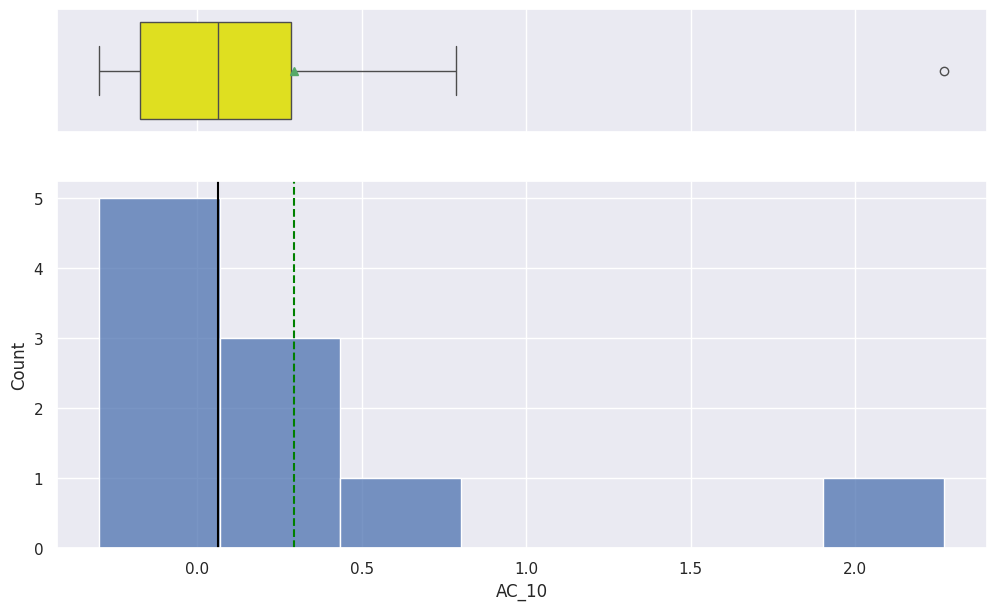

In [ ]:
# univariate analysis of Confidence
histogram_boxplot(ihm_scal_fil, 'AC_10')

In [ ]:
#df_scal_fil.to_csv('Tranining_data_for_regression_scaled.csv', index = True)
ihm_scal_fil.to_csv('In_house_data_for_regression_scaled.csv', index = True)

## **Curation for GC target list**

In [ ]:
df_target = pd.read_csv('/content/GC_target_list_for_ML_prediction.csv')
frame_target = PandasTools.LoadSDF('/content/3D_SDF_target_list.sdf')

af = pd.read_csv('/content/Training_data_classification_selected_descriptors.csv', index_col = 0)
af_without_labels = af.drop(columns = ['Label'])

In [ ]:
df_target.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202 entries, 0 to 201
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Chemicals  202 non-null    object
 1   CASRN      202 non-null    object
 2   inchikeys  202 non-null    object
 3   CIDs       202 non-null    int64 
dtypes: int64(1), object(3)
memory usage: 6.4+ KB


In [ ]:
frame_target.info()

<class 'pandas.core.frame.DataFrame'>
Index: 190 entries, 0 to 189
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   PUBCHEM_COMPOUND_CID            190 non-null    object
 1   PUBCHEM_CONFORMER_RMSD          190 non-null    object
 2   PUBCHEM_CONFORMER_DIVERSEORDER  190 non-null    object
 3   PUBCHEM_MMFF94_PARTIAL_CHARGES  190 non-null    object
 4   PUBCHEM_EFFECTIVE_ROTOR_COUNT   190 non-null    object
 5   PUBCHEM_PHARMACOPHORE_FEATURES  190 non-null    object
 6   PUBCHEM_HEAVY_ATOM_COUNT        190 non-null    object
 7   PUBCHEM_ATOM_DEF_STEREO_COUNT   190 non-null    object
 8   PUBCHEM_ATOM_UDEF_STEREO_COUNT  190 non-null    object
 9   PUBCHEM_BOND_DEF_STEREO_COUNT   190 non-null    object
 10  PUBCHEM_BOND_UDEF_STEREO_COUNT  190 non-null    object
 11  PUBCHEM_ISOTOPIC_ATOM_COUNT     190 non-null    object
 12  PUBCHEM_COMPONENT_COUNT         190 non-null    object


In [ ]:
## Check if the order of elements in two dataframe is the same.
## Need to provide labels using the dataframe read from csv.
##----------------------------------------------------------------------

frame_target['PUBCHEM_COMPOUND_CID'] = frame_target['PUBCHEM_COMPOUND_CID'].astype(int)
df_target['CIDs'] = df_target['CIDs'].astype(int)


overlap_target = list(set(df_target['CIDs'].to_list()).intersection(set(frame_target['PUBCHEM_COMPOUND_CID'].to_list())))
df_target = df_target[df_target['CIDs'].isin(overlap_target)]


# Remove duplicates based on the 'CIDs' column
df_target = df_target.drop_duplicates(subset='CIDs')

# Reset the index of the DataFrame
df_target = df_target.reset_index(drop=True)

order_target = df_target['CIDs'] == frame_target['PUBCHEM_COMPOUND_CID']
order_target.all()

True

In [ ]:
df_target.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Chemicals  190 non-null    object
 1   CASRN      190 non-null    object
 2   inchikeys  190 non-null    object
 3   CIDs       190 non-null    int64 
dtypes: int64(1), object(3)
memory usage: 6.1+ KB


In [ ]:
suppl_target = Chem.SDMolSupplier('/content/3D_SDF_target_list.sdf')

In [ ]:
CASRN_target = df_target['CASRN'].to_list()

from mordred import Calculator, descriptors
mordred_calc = Calculator(descriptors, ignore_3D=False)

# The deprecation for the aliases np.object, np.bool, np.float, np.complex, np.str, and np.int is expired (introduces NumPy 1.20)
np.float = float
np.int = int          #module 'numpy' has no attribute 'int'
np.object = object    #module 'numpy' has no attribute 'object'
np.bool = bool        #module 'numpy' has no attribute 'bool'


result = []
for mol in suppl_target:
  des = mordred_calc(mol)
  result.append(des)
df_mordred_target = pd.DataFrame(result, index = CASRN_target)
df_mordred_target.info()

<class 'pandas.core.frame.DataFrame'>
Index: 190 entries, 76-01-7 to 192-65-4
Columns: 1826 entries, 0 to 1825
dtypes: bool(2), float64(913), int64(320), object(591)
memory usage: 2.6+ MB


In [ ]:
Data_mordred_name = pd.read_csv('/content/drive/MyDrive/AhR/07/mordred descriptors.csv', names = ['descriptors'])
descriptor_name = Data_mordred_name['descriptors'].to_list()

## rename columns using the list

df_mordred_target.columns = descriptor_name

In [ ]:
numeric_columns = af_without_labels.columns
df_mordred_target_filter = df_mordred_target[numeric_columns]

In [ ]:
df_mordred_target_filter.info()

<class 'pandas.core.frame.DataFrame'>
Index: 190 entries, 76-01-7 to 192-65-4
Columns: 529 entries, ABC to mZagreb1
dtypes: float64(395), int64(134)
memory usage: 790.8+ KB


In [ ]:
## Using MinMaxScaler with values below the minimum from the fitting dataset will scale them accordingly, producing values less than 0.
## Handle these out-of-bound values by clipping

# To scale the data from 0-1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

##-----------------------------------------------
## The fit() method is called on training dataset, which computes and stores the minimum and maximum values of each feature in each column
scaler = scaler.fit(af_without_labels)

df_target_scaled = scaler.transform(df_mordred_target_filter)
df_target_scaled = pd.DataFrame(df_target_scaled, columns = df_mordred_target_filter.columns, index = df_mordred_target_filter.index)

In [ ]:
df_target_scaled.head()

,ABC,nAcid,nBase,SpMax_A,SpMAD_A,VE1_A,VR1_A,nAromAtom,nAtom,nSpiro,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS7dv,ATS0s,ATS2s,ATS3s,ATS6s,ATS7s,ATS8s,ATS0Z,ATS1Z,ATS2Z,ATS3Z,ATS4Z,ATS5Z,ATS8Z,AATS0dv,AATS1dv,AATS0d,AATS2d,AATS0s,AATS1s,AATS2s,AATS0Z,AATS1Z,AATS2Z,AATS0v,AATS0se,AATS1se,AATS0p,AATS1p,AATS2p,AATS0i,AATS1i,AATS2i,ATSC0c,ATSC1c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6c,ATSC7c,ATSC8c,ATSC0dv,ATSC1dv,ATSC2dv,ATSC3dv,ATSC4dv,ATSC5dv,ATSC6dv,ATSC7dv,ATSC8dv,ATSC1d,ATSC2d,ATSC3d,ATSC4d,ATSC5d,ATSC6d,ATSC7d,ATSC8d,ATSC1s,ATSC2s,ATSC3s,ATSC4s,ATSC5s,ATSC6s,ATSC7s,ATSC8s,ATSC1Z,ATSC2Z,ATSC3Z,ATSC4Z,ATSC5Z,ATSC6Z,ATSC7Z,ATSC8Z,ATSC1v,ATSC2v,ATSC3v,ATSC4v,ATSC5v,ATSC6v,ATSC7v,ATSC8v,ATSC0se,ATSC1se,ATSC2se,ATSC3se,ATSC4se,ATSC5se,ATSC6se,ATSC7se,ATSC8se,ATSC1pe,ATSC3pe,ATSC0p,ATSC1p,ATSC2p,ATSC3p,ATSC4p,ATSC5p,ATSC6p,ATSC7p,ATSC8p,ATSC0i,ATSC1i,ATSC2i,ATSC3i,ATSC4i,ATSC5i,ATSC6i,ATSC7i,ATSC8i,AATSC0c,AATSC1c,AATSC2c,AATSC0dv,AATSC1dv,AATSC2dv,AATSC0d,AATSC1d,AATSC2d,AATSC0s,AATSC1s,AATSC2s,AATSC0Z,AATSC1Z,AATSC2Z,AATSC0v,AATSC1v,AATSC2v,AATSC0se,AATSC1se,AATSC2se,AATSC0p,AATSC1p,AATSC2p,AATSC0i,AATSC1i,AATSC2i,MATS1c,MATS2c,MATS1dv,MATS2dv,MATS1d,MATS2d,MATS1s,MATS2s,MATS1Z,MATS2Z,MATS1v,MATS1se,MATS2se,MATS1pe,MATS1p,MATS2p,MATS2i,GATS1c,GATS2c,GATS1dv,GATS2dv,GATS1d,GATS2d,GATS1s,GATS2s,GATS1Z,GATS2Z,GATS1v,GATS2v,GATS1se,GATS2se,GATS1p,GATS2p,GATS1i,GATS2i,BCUTc-1h,BCUTc-1l,BCUTdv-1h,BCUTdv-1l,BCUTd-1h,BCUTd-1l,BCUTs-1h,BCUTs-1l,BCUTZ-1h,BCUTZ-1l,BCUTv-1h,BCUTv-1l,BCUTse-1h,BCUTse-1l,BCUTp-1l,BCUTi-1h,BCUTi-1l,BalabanJ,SpMAD_DzZ,SM1_DzZ,SM1_Dzv,SM1_Dzse,BertzCT,nBondsD,nBondsT,PNSA1,PNSA2,PNSA3,PNSA4,PNSA5,PPSA1,PPSA2,PPSA3,PPSA4,DPSA1,DPSA4,FNSA1,FNSA2,FNSA3,FNSA4,FNSA5,FPSA3,FPSA4,WNSA1,WNSA3,WPSA1,WPSA3,RNCG,RPCG,RNCS,RPCS,TASA,TPSA,RASA,C1SP1,C2SP1,C1SP2,C2SP2,C3SP2,C1SP3,C2SP3,C3SP3,C4SP3,FCSP3,Xch-3d,Xch-4d,Xch-5d,Xch-6d,Xch-7d,Xch-4dv,Xch-5dv,Xch-6dv,Xch-7dv,Xc-3d,Xc-4d,Xc-5d,Xc-6d,Xc-3dv,Xc-4dv,Xc-5dv,Xc-6dv,Xpc-4d,Xpc-4dv,Xpc-5dv,AXp-0d,AXp-1d,AXp-2d,AXp-1dv,AXp-2dv,NsCH3,NdCH2,NssCH2,NtCH,NdsCH,NaaCH,NsssCH,NddC,NdssC,NaasC,NaaaC,NssssC,NsNH2,NdNH,NssNH,NaaNH,NtN,NdsN,NaaN,NsssN,NddsN,NaasN,NssssN,NsOH,NdO,NssO,NaaO,NssssSi,NsssP,NsSH,NdS,NssS,NaaS,NdssS,NddssS,SssCH2,SsssCH,SdssC,SaasC,SaaaC,SssssC,SddsN,SaasN,SsssP,AETA_alpha,ETA_shape_p,ETA_shape_y,ETA_shape_x,AETA_beta,AETA_beta_s,ETA_beta_ns_d,AETA_beta_ns_d,AETA_eta,AETA_eta_L,AETA_eta_RL,AETA_eta_F,ETA_eta_B,AETA_eta_BR,ETA_dAlpha_A,ETA_dAlpha_B,ETA_epsilon_2,ETA_epsilon_3,ETA_epsilon_5,ETA_dEpsilon_B,ETA_dEpsilon_D,ETA_dBeta,ETA_psi_1,ETA_dPsi_A,ETA_dPsi_B,fragCpx,fMF,GeomDiameter,GeomShapeIndex,nHBAcc,nHBDon,IC0,IC1,IC2,IC3,SIC0,SIC1,SIC2,SIC3,CIC0,CIC1,CIC2,MIC0,MIC1,ZMIC1,ZMIC2,ZMIC3,Kier2,FilterItLogS,PEOE_VSA1,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA10,SlogP_VSA11,EState_VSA1,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,EState_VSA10,VSA_EState1,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState7,VSA_EState8,VSA_EState9,AMID_h,AMID_N,AMID_O,AMID_X,MOMI-X,MOMI-Z,PBF,piPC8,bpol,nRing,n4Ring,n5Ring,n6Ring,n7Ring,n8Ring,n9Ring,n10Ring,n11Ring,n12Ring,nG12Ring,nHRing,n3HRing,n4HRing,n5HRing,n6HRing,n7HRing,n8HRing,n10HRing,nG12HRing,n3aRing,n4aRing,n5aRing,n7aRing,nG12aRing,naHRing,n6aHRing,nARing,n5ARing,n6ARing,nAHRing,n5AHRing,n6AHRing,nFRing,n6FRing,n7FRing,n8FRing,n9FRing,n10FRing,n11FRing,n12FRing,nG12FRing,nFHRing,n6FHRing,n7FHRing,n10FHRing,n11FHRing,n12FHRing,nG12FHRing,nFaRing,n9FaRing,n10FaRing,n12FaRing,nG12FaRing,nFaHRing,n10FaHRing,nG12FaHRing,nFARing,n9FARing,n10FARing,nG12FARing,nFAHRing,n9FAHRing,n10FAHRing,nG12FAHRing,nRot,RotRatio,SLogP,TopoPSA(NO),TopoPSA,GGI4,GGI5,GGI6,GGI7,GGI8,GGI9,GGI10,JGI2,JGI3,JGI4,JGI5,JG

In [ ]:
df_target_scaled.to_csv('df_target_scaled.csv', index = True)

## **Curation for all candidates for NTA**

In [ ]:
frame_all = PandasTools.LoadSDF('/content/3D_SDF_all.sdf')

af = pd.read_csv('/content/Training_data_classification_selected_descriptors.csv', index_col = 0)
af_without_labels = af.drop(columns = ['Label'])

In [ ]:
suppl_all = Chem.SDMolSupplier('/content/3D_SDF_all.sdf')

In [ ]:
CID_all = frame_all['PUBCHEM_COMPOUND_CID'].to_list()

from mordred import Calculator, descriptors
mordred_calc = Calculator(descriptors, ignore_3D=False)

# The deprecation for the aliases np.object, np.bool, np.float, np.complex, np.str, and np.int is expired (introduces NumPy 1.20)
np.float = float
np.int = int          #module 'numpy' has no attribute 'int'
np.object = object    #module 'numpy' has no attribute 'object'
np.bool = bool        #module 'numpy' has no attribute 'bool'


result = []
for mol in suppl_all:
  des = mordred_calc(mol)
  result.append(des)
df_mordred_all = pd.DataFrame(result, index = CID_all)
df_mordred_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3076 entries, 136590 to 20975209
Columns: 1826 entries, 0 to 1825
dtypes: bool(2), float64(919), int64(310), object(595)
memory usage: 42.8+ MB


In [ ]:
Data_mordred_name = pd.read_csv('/content/drive/MyDrive/AhR/07/mordred descriptors.csv', names = ['descriptors'])
descriptor_name = Data_mordred_name['descriptors'].to_list()

## rename columns using the list

df_mordred_all.columns = descriptor_name

In [ ]:
numeric_columns = af_without_labels.columns
df_mordred_all_filter = df_mordred_all[numeric_columns]

In [ ]:
## Using MinMaxScaler with values below the minimum from the fitting dataset will scale them accordingly, producing values less than 0.
## Handle these out-of-bound values by clipping

# To scale the data from 0-1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

##-----------------------------------------------
## The fit() method is called on training dataset, which computes and stores the minimum and maximum values of each feature in each column
scaler = scaler.fit(af_without_labels)

df_all_scaled = scaler.transform(df_mordred_all_filter)
df_all_scaled = pd.DataFrame(df_all_scaled, columns = df_mordred_all_filter.columns, index = df_mordred_all_filter.index)

In [ ]:
df_all_scaled.to_csv('df_all_scaled.csv', index = True)

In [ ]:
df_all_scaled

<class 'pandas.core.frame.DataFrame'>
Index: 3076 entries, 136590 to 20975209
Columns: 529 entries, ABC to mZagreb1
dtypes: float64(529)
memory usage: 12.5+ MB


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/AhR/06/Training_dataset_classification.csv', index_col=0)

In [ ]:
df_all_scaled.index = df_all_scaled.index.astype(int)
df['CID'] = df['CID'].astype(int)

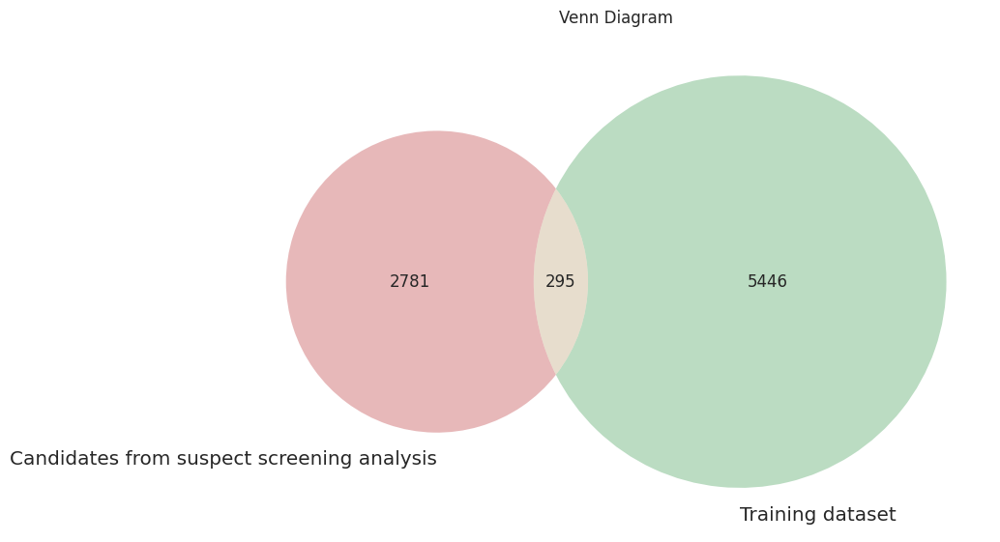

In [ ]:
from matplotlib_venn import venn2, venn2_circles
from matplotlib_venn import venn3, venn3_circles
from matplotlib import pyplot as plt

# show intersection between in house dataset and training dataset for classification
plt.figure(figsize=(10,10))
plt.title("Venn Diagram")

venn2([set(df_all_scaled.index.to_list()),
       set(df['CID'].to_list())],
       set_labels=('Candidates from suspect screening analysis', 'Training dataset')
     )